<a href="https://colab.research.google.com/github/michaelawe01/Research/blob/main/MultiStorey_Building_Traversal.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🏗️ Multi-Storey Building Element Traversal
## Construction Sequencing: Left→Right, Bottom→Up

**Data Source:** `/content/multistorey_building.csv`  
**Coordinate Columns:** `PositionX`, `PositionY`, `PositionZ`

This notebook processes your building data and generates optimal traversal orders for construction sequencing.

## 📦 Setup & Installation

In [1]:
# Install required packages (if needed in your environment)
# !pip install numpy matplotlib pandas

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LinearSegmentedColormap
import warnings
warnings.filterwarnings('ignore')

# Set better plot defaults
plt.rcParams['figure.figsize'] = (14, 10)
plt.rcParams['figure.dpi'] = 100
plt.rcParams['font.size'] = 10

print("✅ All packages imported successfully!")
print(f"📍 NumPy version: {np.__version__}")
print(f"📊 Pandas version: {pd.__version__}")

✅ All packages imported successfully!
📍 NumPy version: 2.0.2
📊 Pandas version: 2.2.2


## 📂 Step 1: Load Multi-Storey Building Data

In [3]:
# File path configuration
CSV_FILE_PATH = '/content/multistorey_building.csv'

# Coordinate column names (as specified in your data)
X_COLUMN = 'PositionX'
Y_COLUMN = 'PositionY'
Z_COLUMN = 'PositionZ'

print(f"🔍 Loading data from: {CSV_FILE_PATH}")
print(f"📌 Expected columns: {X_COLUMN}, {Y_COLUMN}, {Z_COLUMN}")
print("=" * 80)

🔍 Loading data from: /content/multistorey_building.csv
📌 Expected columns: PositionX, PositionY, PositionZ


In [4]:
# Load the CSV file
try:
    df = pd.read_csv(CSV_FILE_PATH)
    print(f"✅ Successfully loaded {len(df)} elements")
    print(f"\n📊 Dataset shape: {df.shape[0]} rows × {df.shape[1]} columns")

    # Display all column names
    print(f"\n📋 Available columns in dataset:")
    for i, col in enumerate(df.columns, 1):
        print(f"   {i:2d}. {col}")

    # Verify required columns exist
    required_cols = [X_COLUMN, Y_COLUMN, Z_COLUMN]
    missing_cols = [col for col in required_cols if col not in df.columns]

    if missing_cols:
        print(f"\n❌ ERROR: Missing required columns: {missing_cols}")
        print("\n💡 Available columns that might be coordinates:")
        coord_like = [col for col in df.columns if any(x in col.lower() for x in ['x', 'y', 'z', 'pos', 'coord', 'location'])]
        for col in coord_like:
            print(f"   - {col}")
    else:
        print(f"\n✅ All required coordinate columns found!")

except FileNotFoundError:
    print("❌ File not found!")
    print("\n💡 To upload your CSV file in Google Colab:")
    print("   1. Click the folder icon (📁) on the left sidebar")
    print("   2. Click the upload button")
    print("   3. Select 'multistorey_building.csv'")
    print("\n   Or run this code:")
    print("   from google.colab import files")
    print("   uploaded = files.upload()")
    raise

✅ Successfully loaded 23720 elements

📊 Dataset shape: 23720 rows × 37 columns

📋 Available columns in dataset:
    1. _id
    2. activityGuid
    3. bimNodeId
    4. name
    5. dbId
    6. Found
    7. ElementName
    8. Element Name
    9. Element ID
   10. ElementLevel
   11. Sub/Super
   12. Category
   13. ElementCategory
   14. PositionX
   15. PositionY
   16. PositionZ
   17. Rel_Dist
   18. Volume
   19. Area
   20. Length
   21. Width
   22. Height
   23. Depth
   24. Thickness
   25. Diameter
   26. Perimeter
   27. Slope
   28. CutLength
   29. TopElevation
   30. BottomElevation
   31. TopConstraint
   32. BottomConstraint
   33. BaseIsAttached
   34. TopIsAttached
   35. RoomBounding
   36. Structural
   37. StructuralUsage

✅ All required coordinate columns found!


In [5]:
# Preview the data
print("📄 First 10 rows of your building data:")
print("=" * 80)
display(df.head(10))

print("\n📊 Statistical summary of coordinate columns:")
print("=" * 80)
display(df[[X_COLUMN, Y_COLUMN, Z_COLUMN]].describe())

📄 First 10 rows of your building data:


,_id,activityGuid,bimNodeId,name,dbId,Found,ElementName,Element Name,Element ID,ElementLevel,...,CutLength,TopElevation,BottomElevation,TopConstraint,BottomConstraint,BaseIsAttached,TopIsAttached,RoomBounding,Structural,StructuralUsage
0,E8F4E746-F8EE-8502-0541-43C5CFD7C587,33553C75-F854-F050-711F-FD6A04CD2FB3,0du3gs_dj2XwZfgw6Gpt_y,M_Concrete-Rectangular Beam [1680973],22890,True,M_Concrete-Rectangular Beam [1680973],M_Concrete-Rectangular Beam,1680973,L58 SSL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"concrete, cast-in-place gray",Girder
1,AA194E19-3B63-650A-9AEA-2F65646E328B,33553C75-F854-F050-711F-FD6A04CD2FB3,0du3gs_dj2XwZfgw6Gptvv,Floor [1681288],34479,True,Floor [1681288],Floor,1681288,L58 SSL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,Yes,NaN
2,94034FBA-F41D-8AE3-1A20-53914774A387,33553C75-F854-F050-711F-FD6A04CD2FB3,3RtD$uxx19ZPjVhAB8Z$YY,M_Concrete-Rectangular Beam [1856269],23089,True,M_Concrete-Rectangular Beam [1856269],M_Concrete-Rectangular Beam,1856269,L58 SSL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"concrete, cast-in-place gray",Other
3,00D8E617-0D5D-6C5C-CC05-B77DED5B2FBD,33553C75-F854-F050-711F-FD6A04CD2FB3,0du3gs_dj2XwZfgw6Gptmq,M_Concrete-Rectangular Beam [1680837],22760,True,M_Concrete-Rectangular Beam [1680837],M_Concrete-Rectangular Beam,1680837,L58 SSL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"concrete, cast-in-place gray",Girder
4,6728BA41-870B-CAEF-99C0-0C62DA2CB483,33553C75-F854-F050-711F-FD6A04CD2FB3,0du3gs_dj2XwZfgw6Gptmm,M_Concrete-Rectangular Beam [1680833],22087,True,M_Concrete-Rectangular Beam [1680833],M_Concrete-Rectangular Beam,1680833,L58 SSL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"concrete, cast-in-place gray",Girder
5,200B4C55-5AE3-AB45-4433-D243FFA9EE92,33553C75-F854-F050-711F-FD6A04CD2FB3,0du3gs_dj2XwZfgw6Gpt$_,M_Concrete-Rectangular Beam [1680911],17953,True,M_Concrete-Rectangular Beam [1680911],M_Concrete-Rectangular Beam,1680911,L58 SSL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"concrete, cast-in-place gray",Girder
6,6139C5A8-F3C0-96C1-67D3-ED3F36940B2E,33553C75-F854-F050-711F-FD6A04CD2FB3,0du3gs_dj2XwZfgw6Gptuu,Floor [1681353],34483,True,Floor [1681353],Floor,1681353,L58 SSL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,Yes,NaN
7,179E3A2E-D5E4-4DA5-561F-B9509B67BEA5,33553C75-F854-F050-711F-FD6A04CD2FB3,0du3gs_dj2XwZfgw6Gptwr,M_Concrete-Rectangular Beam [1681220],22891,True,M_Concrete-Rectangular Beam [1681220],M_Concrete-Rectangular Beam,1681220,L58 SSL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"concrete, cast-in-place gray",Girder
8,964F32F5-0640-E3BD-F87B-2C3A5A7FDDF5,33553C75-F854-F050-711F-FD6A04CD2FB3,0du3gs_dj2XwZfgw6Gpt$P,M_Concrete-Rectangular Beam [1680936],18028,True,M_Concrete-Rectangular Beam [1680936],M_Concrete-Rectangular Beam,1680936,L58 SSL,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"concrete, cast-in-place gray",Girder
9,F0363BA1-F80C-3A15-205A-AE1F06533371,33553C75-F854-F050-711F-FD6A04CD2FB3,3ZwlN$IOLFA92lgPNRLGxc,LB22_Downward Lump9 [2003955],31179,True,LB22_Downward Lump9 [2003955],LB22_Downward Lump9,2003955,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,<by category>,NaN



📊 Statistical summary of coordinate columns:


,PositionX,PositionY,PositionZ
count,23720.000000,2.372000e+04,23720.000000
mean,271170.647528,2.102989e+06,114.602914
std,16.318590,1.494451e+01,84.393121
min,271096.497200,2.102953e+06,-18.775001
25%,271157.343000,2.102981e+06,34.862500
50%,271170.047300,2.102987e+06,111.325001
75%,271184.168100,2.102996e+06,188.674996
max,271225.572100,2.103058e+06,267.023005


In [6]:
# Extract 3D coordinates
points = df[[X_COLUMN, Y_COLUMN, Z_COLUMN]].values

# Remove any NaN or invalid points
valid_mask = ~np.isnan(points).any(axis=1)
points = points[valid_mask]
df_clean = df[valid_mask].copy()

if len(points) < len(df):
    print(f"⚠️ Removed {len(df) - len(points)} rows with invalid coordinates")

print(f"\n📍 Total valid 3D points: {len(points)}")
print(f"\n📏 Building coordinate ranges:")
print(f"   X (Left→Right):   [{points[:, 0].min():,.2f}, {points[:, 0].max():,.2f}]")
print(f"   Y (Front→Back):   [{points[:, 1].min():,.2f}, {points[:, 1].max():,.2f}]")
print(f"   Z (Bottom→Top):   [{points[:, 2].min():,.2f}, {points[:, 2].max():,.2f}]")

print(f"\n🏗️ Building dimensions:")
width = points[:, 0].max() - points[:, 0].min()
depth = points[:, 1].max() - points[:, 1].min()
height = points[:, 2].max() - points[:, 2].min()
print(f"   Width (X):  {width:,.2f} units")
print(f"   Depth (Y):  {depth:,.2f} units")
print(f"   Height (Z): {height:,.2f} units")

# Detect number of floors
z_unique = np.unique(points[:, 2])
print(f"\n🏢 Detected {len(z_unique)} unique Z-levels (potential floors)")
print(f"   Floor elevations: {z_unique[:10]}..." if len(z_unique) > 10 else f"   Floor elevations: {z_unique}")


📍 Total valid 3D points: 23720

📏 Building coordinate ranges:
   X (Left→Right):   [271,096.50, 271,225.57]
   Y (Front→Back):   [2,102,953.23, 2,103,057.93]
   Z (Bottom→Top):   [-18.78, 267.02]

🏗️ Building dimensions:
   Width (X):  129.07 units
   Depth (Y):  104.69 units
   Height (Z): 285.80 units

🏢 Detected 2771 unique Z-levels (potential floors)
   Floor elevations: [-18.7750005  -16.32500004 -16.02499975 -15.09999982 -14.99999952
 -14.94999967 -14.82499974 -14.31249963 -14.02499973 -13.94999966]...


## 🧮 Step 2: Algorithm Implementations

We implement 5 different traversal algorithms optimized for construction sequencing.

In [7]:
# ============================================================================
# ALGORITHM 1: LEXICOGRAPHIC ORDERING (RECOMMENDED) ⭐
# ============================================================================
def lexicographic_ordering(points):
    """
    Sort by: PositionX (primary) → PositionZ (secondary) → PositionY (tertiary)
    Ensures strict left-to-right, then bottom-to-up progression

    Time complexity: O(n log n)
    Best for: Systematic construction with guaranteed directional flow
    """
    # Sort: Y (tertiary), Z (secondary), X (primary)
    indices = np.lexsort((points[:, 1], points[:, 2], points[:, 0]))
    return indices


# ============================================================================
# ALGORITHM 2: LAYER-BY-LAYER CONSTRUCTION
# ============================================================================
def layer_by_layer(points, layer_height=None):
    """
    Simulate floor-by-floor construction:
    1. Group elements by floor (Z-level)
    2. Within each floor, sweep left-to-right

    Time complexity: O(n log n)
    Best for: Traditional multi-story construction
    """
    if layer_height is None:
        # Auto-detect floor height
        z_unique = np.unique(points[:, 2])
        if len(z_unique) > 1:
            z_diffs = np.diff(np.sort(z_unique))
            layer_height = np.median(z_diffs[z_diffs > 0.01])  # Ignore tiny differences
        else:
            layer_height = 1.0

    z_min = points[:, 2].min()
    layers = ((points[:, 2] - z_min) / layer_height).astype(int)

    # Sort by: layer (primary), X (secondary), Y (tertiary)
    sort_keys = (points[:, 1], points[:, 0], layers)
    indices = np.lexsort(sort_keys)
    return indices


# ============================================================================
# ALGORITHM 3: PLANE SWEEP (XZ)
# ============================================================================
def plane_sweep_xz(points, num_slices=10):
    """
    Divide building into vertical slices along X-axis,
    then process each slice bottom-to-top

    Time complexity: O(n log n)
    Best for: Large buildings with natural spatial divisions
    """
    x_min, x_max = points[:, 0].min(), points[:, 0].max()
    x_range = x_max - x_min

    if x_range < 0.001:  # All points at same X
        return np.lexsort((points[:, 1], points[:, 2]))

    slice_width = x_range / num_slices
    slices = ((points[:, 0] - x_min) / slice_width).astype(int)
    slices = np.clip(slices, 0, num_slices - 1)

    # Sort by: slice (primary), Z (secondary), Y (tertiary)
    sort_keys = (points[:, 1], points[:, 2], slices)
    indices = np.lexsort(sort_keys)
    return indices


# ============================================================================
# ALGORITHM 4: Z-ORDER (MORTON CURVE)
# ============================================================================
def morton_encode(x, y, z, bits=16):
    """Encode 3D coordinates to Morton code"""
    def spread_bits(n, bits):
        n = int(n) & ((1 << bits) - 1)
        result = 0
        for i in range(bits):
            if n & (1 << i):
                result |= 1 << (3 * i)
        return result

    return spread_bits(x, bits) | (spread_bits(y, bits) << 1) | (spread_bits(z, bits) << 2)


def z_order_curve(points):
    """
    Space-filling curve that maintains good spatial locality

    Time complexity: O(n log n)
    Best for: Balanced traversal with good cache performance
    """
    # Normalize to [0, 65535] range
    mins = points.min(axis=0)
    maxs = points.max(axis=0)
    ranges = maxs - mins
    ranges[ranges == 0] = 1

    normalized = ((points - mins) / ranges * 65535).astype(int)

    # Calculate Morton codes
    morton_codes = np.array([morton_encode(p[0], p[1], p[2]) for p in normalized])
    return np.argsort(morton_codes)


# ============================================================================
# ALGORITHM 5: NEAREST NEIGHBOR WITH CONSTRUCTION PRIORITY
# ============================================================================
def nearest_neighbor_priority(points, start_idx=None):
    """
    Greedy nearest neighbor with weighted preference for:
    - Points to the right (larger X)
    - Points above (larger Z)

    Time complexity: O(n²)
    Best for: Minimizing travel distance while respecting construction logic
    """
    n = len(points)
    if n == 0:
        return np.array([])

    unvisited = set(range(n))

    # Start from leftmost, lowest point
    if start_idx is None:
        start_idx = np.lexsort((points[:, 2], points[:, 0]))[0]

    path = [start_idx]
    unvisited.remove(start_idx)
    current = start_idx

    while unvisited:
        current_point = points[current]
        candidates = list(unvisited)
        candidates_points = points[candidates]

        # Base distance
        distances = np.linalg.norm(candidates_points - current_point, axis=1)

        # Construction priority weights
        x_priority = -(candidates_points[:, 0] - current_point[0]) * 0.3  # Prefer right
        z_priority = -(candidates_points[:, 2] - current_point[2]) * 0.2  # Prefer up

        # Penalty for going backwards
        backwards_penalty = np.where(candidates_points[:, 0] < current_point[0] - 0.1, 100.0, 0.0)

        # Combined score
        scores = distances + x_priority + z_priority + backwards_penalty

        best_idx = candidates[np.argmin(scores)]
        path.append(best_idx)
        unvisited.remove(best_idx)
        current = best_idx

    return np.array(path)


print("✅ All 5 algorithms loaded successfully!")
print("\n📚 Available algorithms:")
print("   1. Lexicographic Ordering (X→Z→Y) ⭐ RECOMMENDED")
print("   2. Layer-by-Layer Construction")
print("   3. Plane Sweep (XZ slices)")
print("   4. Z-Order Curve (Morton)")
print("   5. Nearest Neighbor with Priority")

✅ All 5 algorithms loaded successfully!

📚 Available algorithms:
   1. Lexicographic Ordering (X→Z→Y) ⭐ RECOMMENDED
   2. Layer-by-Layer Construction
   3. Plane Sweep (XZ slices)
   4. Z-Order Curve (Morton)
   5. Nearest Neighbor with Priority


## 📊 Step 3: Performance Metrics

In [8]:
def calculate_metrics(points, order):
    """
    Calculate performance metrics for a traversal order
    """
    if len(order) < 2:
        return {}

    ordered_points = points[order]

    # Path distances
    distances = np.linalg.norm(np.diff(ordered_points, axis=0), axis=1)
    total_distance = distances.sum()

    # Directional analysis
    x_diffs = np.diff(ordered_points[:, 0])
    z_diffs = np.diff(ordered_points[:, 2])

    # Count backwards movements
    x_backwards = np.sum(x_diffs < -0.001)
    z_backwards = np.sum(z_diffs < -0.001)

    # Progress ratios
    n_steps = len(x_diffs)
    x_forward = np.sum(x_diffs > 0.001)
    z_upward = np.sum(z_diffs > 0.001)

    metrics = {
        'Total Distance': total_distance,
        'Average Step': distances.mean(),
        'Max Step': distances.max(),
        'Min Step': distances.min(),
        'X Backwards Moves': x_backwards,
        'Z Downward Moves': z_backwards,
        'X Forward %': (x_forward / n_steps * 100) if n_steps > 0 else 0,
        'Z Upward %': (z_upward / n_steps * 100) if n_steps > 0 else 0
    }

    return metrics


print("✅ Metrics calculator ready!")

✅ Metrics calculator ready!


## 📈 Step 4: Visualization Functions

In [9]:
def plot_traversal_3d(points, order, title="3D Building Element Traversal", show_path=True, max_path_lines=500):
    """
    Create 3D visualization of the traversal path
    """
    fig = plt.figure(figsize=(16, 12))
    ax = fig.add_subplot(111, projection='3d')

    ordered_points = points[order]
    n = len(order)

    # Color gradient from blue (start) to red (end)
    colors = plt.cm.viridis(np.linspace(0, 1, n))

    # Plot all points in light gray
    ax.scatter(points[:, 0], points[:, 1], points[:, 2],
               c='lightgray', s=20, alpha=0.2, label='All elements')

    # Plot ordered path with color gradient
    scatter = ax.scatter(ordered_points[:, 0],
                        ordered_points[:, 1],
                        ordered_points[:, 2],
                        c=np.arange(n), cmap='viridis',
                        s=50, edgecolors='black', linewidths=0.5,
                        label='Traversal order')

    # Draw path (limit lines for performance)
    if show_path and n > 1:
        step = max(1, n // max_path_lines)
        for i in range(0, n - 1, step):
            j = min(i + step, n - 1)
            ax.plot([ordered_points[i, 0], ordered_points[j, 0]],
                   [ordered_points[i, 1], ordered_points[j, 1]],
                   [ordered_points[i, 2], ordered_points[j, 2]],
                   'b-', alpha=0.2, linewidth=0.5)

    # Mark start and end
    ax.scatter(ordered_points[0, 0], ordered_points[0, 1], ordered_points[0, 2],
              c='lime', s=400, marker='*', edgecolors='black',
              linewidths=2, label='START', zorder=10)
    ax.scatter(ordered_points[-1, 0], ordered_points[-1, 1], ordered_points[-1, 2],
              c='red', s=400, marker='*', edgecolors='black',
              linewidths=2, label='END', zorder=10)

    # Labels and title
    ax.set_xlabel('PositionX (Left → Right)', fontsize=12, fontweight='bold')
    ax.set_ylabel('PositionY (Front → Back)', fontsize=12)
    ax.set_zlabel('PositionZ (Bottom ↑ Top)', fontsize=12, fontweight='bold')
    ax.set_title(title, fontsize=14, fontweight='bold', pad=20)
    ax.legend(loc='upper left', fontsize=10)
    ax.grid(True, alpha=0.3)

    # Add colorbar
    cbar = plt.colorbar(scatter, ax=ax, pad=0.1, shrink=0.8)
    cbar.set_label('Construction Sequence', fontsize=10)

    plt.tight_layout()
    return fig, ax


def plot_projection_comparison(points, order, title="2D Projections of Traversal Path"):
    """
    Show XY, XZ, YZ projections
    """
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    ordered_points = points[order]
    n = len(order)
    colors = np.arange(n)

    # XY projection (Top view)
    scatter1 = axes[0].scatter(ordered_points[:, 0], ordered_points[:, 1],
                               c=colors, cmap='viridis', s=30, alpha=0.7)
    axes[0].plot(ordered_points[:, 0], ordered_points[:, 1], 'b-', alpha=0.2, linewidth=0.5)
    axes[0].scatter(ordered_points[0, 0], ordered_points[0, 1], c='lime', s=200, marker='*', edgecolors='black', zorder=5)
    axes[0].scatter(ordered_points[-1, 0], ordered_points[-1, 1], c='red', s=200, marker='*', edgecolors='black', zorder=5)
    axes[0].set_xlabel('PositionX', fontweight='bold')
    axes[0].set_ylabel('PositionY')
    axes[0].set_title('XY View (Top)', fontweight='bold')
    axes[0].grid(True, alpha=0.3)
    axes[0].set_aspect('equal', adjustable='box')

    # XZ projection (Front view)
    scatter2 = axes[1].scatter(ordered_points[:, 0], ordered_points[:, 2],
                               c=colors, cmap='viridis', s=30, alpha=0.7)
    axes[1].plot(ordered_points[:, 0], ordered_points[:, 2], 'b-', alpha=0.2, linewidth=0.5)
    axes[1].scatter(ordered_points[0, 0], ordered_points[0, 2], c='lime', s=200, marker='*', edgecolors='black', zorder=5)
    axes[1].scatter(ordered_points[-1, 0], ordered_points[-1, 2], c='red', s=200, marker='*', edgecolors='black', zorder=5)
    axes[1].set_xlabel('PositionX', fontweight='bold')
    axes[1].set_ylabel('PositionZ', fontweight='bold')
    axes[1].set_title('XZ View (Front) - Shows L→R, B→T', fontweight='bold')
    axes[1].grid(True, alpha=0.3)
    axes[1].set_aspect('equal', adjustable='box')

    # YZ projection (Side view)
    scatter3 = axes[2].scatter(ordered_points[:, 1], ordered_points[:, 2],
                               c=colors, cmap='viridis', s=30, alpha=0.7)
    axes[2].plot(ordered_points[:, 1], ordered_points[:, 2], 'b-', alpha=0.2, linewidth=0.5)
    axes[2].scatter(ordered_points[0, 1], ordered_points[0, 2], c='lime', s=200, marker='*', edgecolors='black', zorder=5)
    axes[2].scatter(ordered_points[-1, 1], ordered_points[-1, 2], c='red', s=200, marker='*', edgecolors='black', zorder=5)
    axes[2].set_xlabel('PositionY')
    axes[2].set_ylabel('PositionZ', fontweight='bold')
    axes[2].set_title('YZ View (Side)', fontweight='bold')
    axes[2].grid(True, alpha=0.3)
    axes[2].set_aspect('equal', adjustable='box')

    plt.suptitle(title, fontsize=14, fontweight='bold', y=1.02)
    plt.tight_layout()
    return fig


print("✅ Visualization functions loaded!")

✅ Visualization functions loaded!


## 🚀 Step 5: Run All Algorithms and Compare

In [10]:
# Define all algorithms
algorithms = {
    'Lexicographic (X→Z→Y)': lexicographic_ordering,
    'Layer-by-Layer': layer_by_layer,
    'Plane Sweep (XZ)': plane_sweep_xz,
    'Z-Order (Morton)': z_order_curve,
    'Nearest Neighbor Priority': nearest_neighbor_priority
}

print("🔄 Running all algorithms...")
print("=" * 80)

results = {}

for name, algorithm in algorithms.items():
    print(f"\n▶️  Running: {name}")
    try:
        import time
        start_time = time.time()

        order = algorithm(points)

        elapsed = time.time() - start_time
        metrics = calculate_metrics(points, order)

        results[name] = {
            'order': order,
            'metrics': metrics,
            'time': elapsed
        }

        print(f"   ✅ Completed in {elapsed:.3f}s")
        print(f"   📏 Total Distance: {metrics.get('Total Distance', 0):,.2f}")
        print(f"   ⬅️ X Backwards: {metrics.get('X Backwards Moves', 0)}")
        print(f"   ⬇️ Z Downward: {metrics.get('Z Downward Moves', 0)}")

    except Exception as e:
        print(f"   ❌ Error: {str(e)}")
        results[name] = {'order': None, 'metrics': {}, 'time': 0}

print("\n" + "=" * 80)
print("✅ All algorithms completed!")

🔄 Running all algorithms...

▶️  Running: Lexicographic (X→Z→Y)
   ✅ Completed in 0.006s
   📏 Total Distance: 446,293.89
   ⬅️ X Backwards: 0
   ⬇️ Z Downward: 2695

▶️  Running: Layer-by-Layer
   ✅ Completed in 0.005s
   📏 Total Distance: 314,165.92
   ⬅️ X Backwards: 1629
   ⬇️ Z Downward: 1364

▶️  Running: Plane Sweep (XZ)
   ✅ Completed in 0.004s
   📏 Total Distance: 197,468.08
   ⬅️ X Backwards: 11870
   ⬇️ Z Downward: 9

▶️  Running: Z-Order (Morton)
   ✅ Completed in 0.130s
   📏 Total Distance: 83,863.40
   ⬅️ X Backwards: 7763
   ⬇️ Z Downward: 8416

▶️  Running: Nearest Neighbor Priority
   ✅ Completed in 32.490s
   📏 Total Distance: 99,953.02
   ⬅️ X Backwards: 3553
   ⬇️ Z Downward: 10844

✅ All algorithms completed!


In [11]:
# Create comparison DataFrame
comparison_data = {}
for name, data in results.items():
    if data['metrics']:
        comparison_data[name] = {
            **data['metrics'],
            'Computation Time (s)': data['time']
        }

comparison_df = pd.DataFrame(comparison_data).T

print("\n📊 ALGORITHM COMPARISON TABLE")
print("=" * 100)
display(comparison_df.style.highlight_min(subset=['Total Distance', 'X Backwards Moves', 'Z Downward Moves'], color='lightgreen')
                           .highlight_max(subset=['X Forward %', 'Z Upward %'], color='lightgreen')
                           .format({
                               'Total Distance': '{:,.2f}',
                               'Average Step': '{:.2f}',
                               'Max Step': '{:.2f}',
                               'Min Step': '{:.2f}',
                               'X Forward %': '{:.1f}%',
                               'Z Upward %': '{:.1f}%',
                               'Computation Time (s)': '{:.4f}'
                           }))

print("\n📌 Interpretation:")
print("   🟢 Green = Best performance")
print("   Lower 'Total Distance' = Shorter path")
print("   Lower 'Backwards/Downward Moves' = Better directional consistency")
print("   Higher 'Forward/Upward %' = Better adherence to construction logic")


📊 ALGORITHM COMPARISON TABLE


,Total Distance,Average Step,Max Step,Min Step,X Backwards Moves,Z Downward Moves,X Forward %,Z Upward %,Computation Time (s)
Lexicographic (X→Z→Y),"446,293.89",18.82,281.18,0.00,0.000000,2695.000000,14.0%,84.8%,0.0065
Layer-by-Layer,"314,165.92",13.25,113.86,0.00,1629.000000,1364.000000,89.3%,13.5%,0.0047
Plane Sweep (XZ),"197,468.08",8.33,286.30,0.00,11870.000000,9.000000,46.2%,26.8%,0.0036
Z-Order (Morton),"83,863.40",3.54,143.55,0.00,7763.000000,8416.000000,40.5%,53.3%,0.1296
Nearest Neighbor Priority,"99,953.02",4.21,132.45,0.00,3553.000000,10844.000000,15.4%,47.4%,32.4895



📌 Interpretation:
   🟢 Green = Best performance
   Lower 'Total Distance' = Shorter path
   Lower 'Backwards/Downward Moves' = Better directional consistency
   Higher 'Forward/Upward %' = Better adherence to construction logic


## 🎨 Step 6: Visualize Recommended Algorithm

📍 Visualizing: Lexicographic (X→Z→Y)

📊 Performance Metrics:
   Total Distance: 446,293.89
   Average Step: 18.82
   Max Step: 281.18
   Min Step: 0.00
   X Forward %: 13.98
   Z Upward %: 84.83


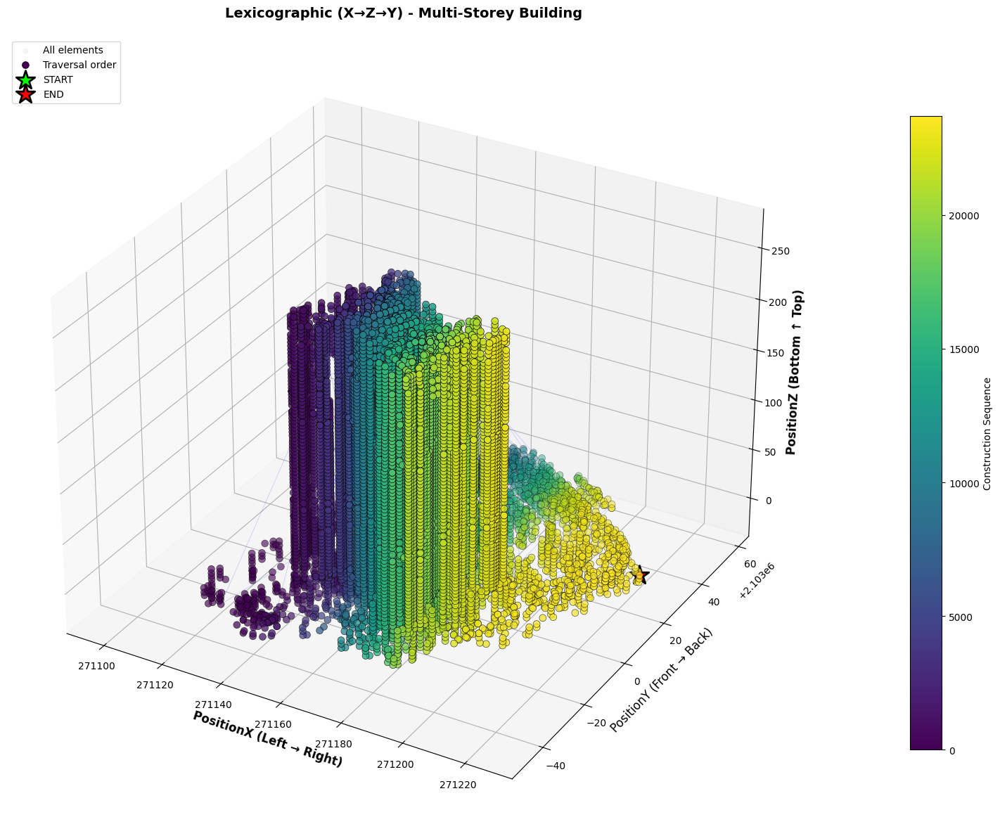

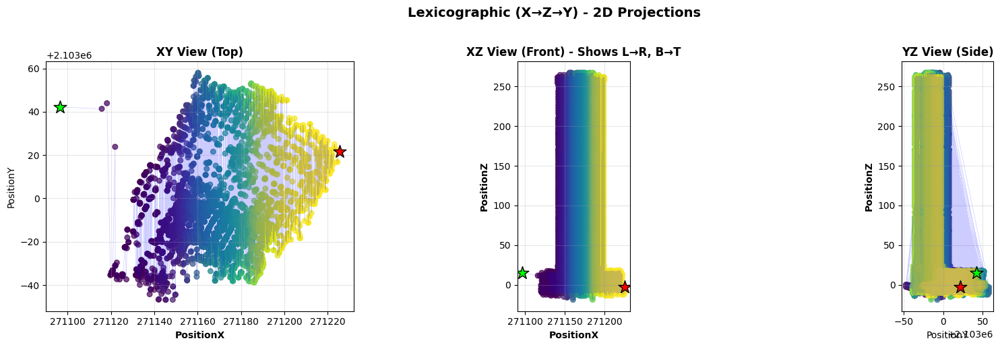

In [12]:
# Visualize LEXICOGRAPHIC ordering (recommended for construction)
recommended_name = 'Lexicographic (X→Z→Y)'
recommended_order = results[recommended_name]['order']
recommended_metrics = results[recommended_name]['metrics']

print(f"📍 Visualizing: {recommended_name}")
print(f"\n📊 Performance Metrics:")
for key, value in recommended_metrics.items():
    if isinstance(value, (int, float)):
        print(f"   {key}: {value:,.2f}")

# 3D visualization
fig1, ax1 = plot_traversal_3d(points, recommended_order,
                               f"{recommended_name} - Multi-Storey Building",
                               show_path=True)
plt.show()

# 2D projections
fig2 = plot_projection_comparison(points, recommended_order,
                                  f"{recommended_name} - 2D Projections")
plt.show()

## 🔍 Step 7: Compare Lexicographic vs Layer-by-Layer

🔄 Comparing Lexicographic vs Layer-by-Layer approaches



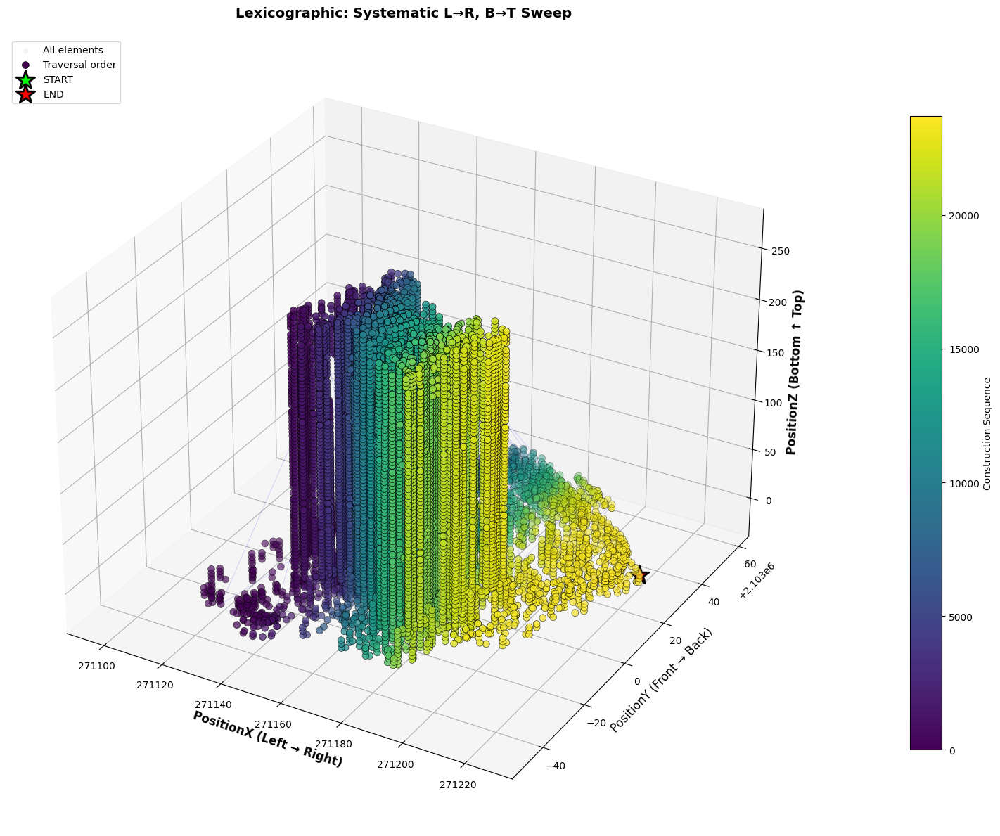

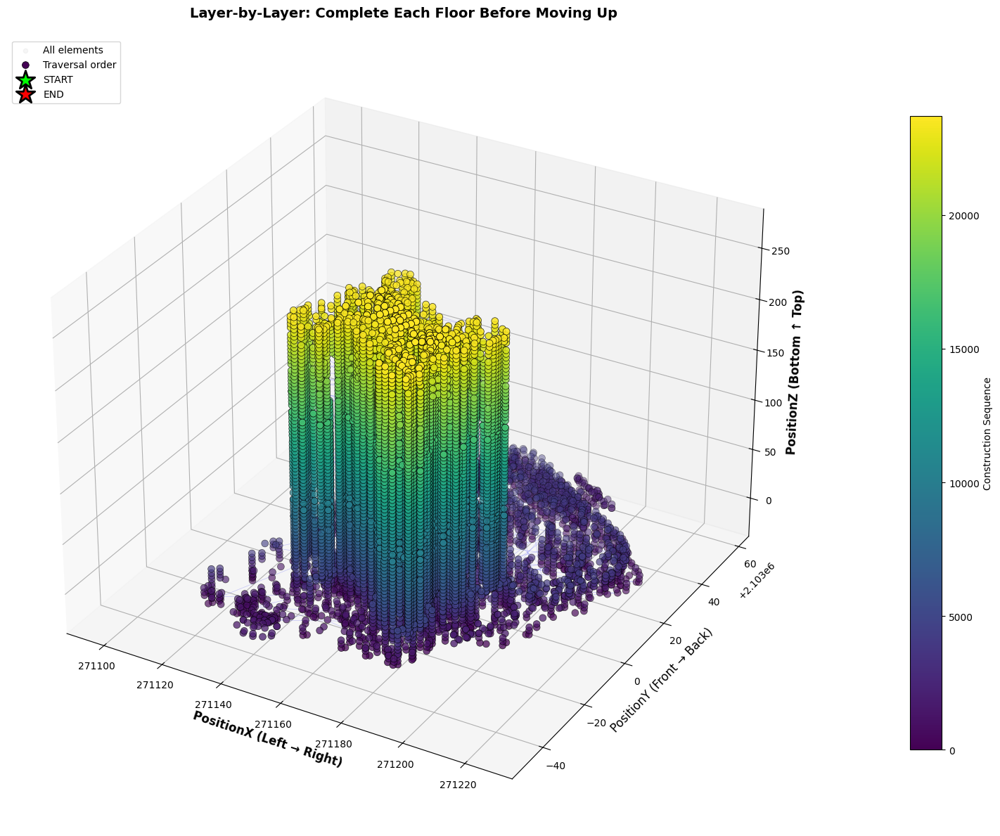

In [13]:
# Compare the two most practical algorithms for construction
lex_order = results['Lexicographic (X→Z→Y)']['order']
layer_order = results['Layer-by-Layer']['order']

print("🔄 Comparing Lexicographic vs Layer-by-Layer approaches\n")

# Lexicographic
fig3, ax3 = plot_traversal_3d(points, lex_order,
                               "Lexicographic: Systematic L→R, B→T Sweep",
                               show_path=True)
plt.show()

# Layer-by-Layer
fig4, ax4 = plot_traversal_3d(points, layer_order,
                               "Layer-by-Layer: Complete Each Floor Before Moving Up",
                               show_path=True)
plt.show()

## 💾 Step 8: Export Results

In [14]:
# Export ordered sequence using Lexicographic algorithm
optimal_order = results['Lexicographic (X→Z→Y)']['order']

# Create output DataFrame with all original columns plus sequence info
df_ordered = df_clean.iloc[optimal_order].copy()
df_ordered.insert(0, 'ConstructionSequence', range(1, len(df_ordered) + 1))
df_ordered.insert(1, 'OriginalIndex', optimal_order)

# Preview
print("📄 Ordered elements (first 15 rows):")
print("=" * 80)
display(df_ordered.head(15))

# Save to CSV
output_filename = 'multistorey_building_ORDERED.csv'
df_ordered.to_csv(output_filename, index=False)
print(f"\n✅ Saved ordered sequence to: {output_filename}")
print(f"   Total elements: {len(df_ordered)}")

# Also save just the coordinates in order
ordered_coords = pd.DataFrame(
    points[optimal_order],
    columns=['PositionX', 'PositionY', 'PositionZ']
)
ordered_coords.insert(0, 'Sequence', range(1, len(ordered_coords) + 1))
ordered_coords.insert(1, 'OriginalIndex', optimal_order)

coords_filename = 'construction_sequence_coordinates.csv'
ordered_coords.to_csv(coords_filename, index=False)
print(f"✅ Saved coordinate sequence to: {coords_filename}")

📄 Ordered elements (first 15 rows):


,ConstructionSequence,OriginalIndex,_id,activityGuid,bimNodeId,name,dbId,Found,ElementName,Element Name,...,CutLength,TopElevation,BottomElevation,TopConstraint,BottomConstraint,BaseIsAttached,TopIsAttached,RoomBounding,Structural,StructuralUsage
23064,1,23064,AE56707E-92AA-C15D-EC7E-2EA5BF6A80C6,5356F10D-9937-5265-8571-C9761CEFB35E,0_katjNFvBwAEifcWiFEsn,Basic Wall [1792674],15954,True,Basic Wall [1792674],Basic Wall,...,NaN,NaN,NaN,Up to level: L05 FFL_PO,L04 FFL_PO,No,No,Yes,Yes,NaN
23208,2,23208,4BC60BE5-C9E1-A9DE-ECAE-00A0564363A1,5E6FFBA0-8AC2-0892-3081-48AEA14C2953,0_katjNFvBwAEifcWiF8X0,Basic Wall [1785683],16160,True,Basic Wall [1785683],Basic Wall,...,NaN,NaN,NaN,Up to level: L04 FFL_PO,L03 FFL_PO,No,No,Yes,Yes,NaN
23217,3,23217,C8397EC0-736D-AFFE-8566-78601D652288,5E6FFBA0-8AC2-0892-3081-48AEA14C2953,0_katjNFvBwAEifcWiF8X2,Basic Wall [1785681],15912,True,Basic Wall [1785681],Basic Wall,...,NaN,NaN,NaN,Up to level: L04 FFL_PO,L03 FFL_PO,No,No,Yes,Yes,NaN
13754,4,13754,5A1811CD-2483-F2C7-54CB-29F1CC2E7811,A204B097-A621-BC9C-6F00-60628F46F920,3$oqa2kTP7WvXQeV9smyRt,JW_Concrete-Rectangular Beam [9113943],1400,True,JW_Concrete-Rectangular Beam [9113943],JW_Concrete-Rectangular Beam,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"concrete, cast-in-place gray",Other
13323,5,13323,3C89E288-5A39-D148-CD80-1541B5716843,189DE176-DAF2-0B76-3768-CF716F12C70A,3zu3O2nMPAIQxjcRSbH4Xa,JW_Concrete-Rectangular Beam [8617670],1397,True,JW_Concrete-Rectangular Beam [8617670],JW_Concrete-Rectangular Beam,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"concrete, cast-in-place gray",Other
12725,6,12725,20AEB61E-F320-99A4-AA8C-BCE743D8C249,9E0678B9-997E-0C15-200E-1C01C6814EC3,1eIrDXzuL1MQtcXk_bZvmH,JW_Concrete-Rectangular Beam [8612140],1394,True,JW_Concrete-Rectangular Beam [8612140],JW_Concrete-Rectangular Beam,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"concrete, cast-in-place gray",Other
13380,7,13380,D11E00C3-654A-A8EB-640D-8552E28EB07C,189DE176-DAF2-0B76-3768-CF716F12C70A,3fkuzBPlzBDAOYr8ZizPcp,Floor [8894949],2447,True,Floor [8894949],Floor,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,Yes,NaN
13767,8,13767,AAD35AD3-AFB7-25A2-349B-979E0BAE0436,A204B097-A621-BC9C-6F00-60628F46F920,2axcakhPX2DP1m_CaGwihA,Floor [9114069],2451,True,Floor [9114069],Floor,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,Yes,NaN
12699,9,12699,41A8926E-C0D6-9256-72D5-A0D7FDABD350,9E0678B9-997E-0C15-200E-1C01C6814EC3,1ggPgM1z1DvBeN7IMbCjb0,Floor [8899993],2449,True,Floor [8899993],Floor,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,Yes,NaN
12223,10,12223,029B987E-1806-0657-1D3F-930EA952A5C1,9127B5FC-6693-FB1F-9471-2A99746D190C,2j_y1gVwfClBAB1Grw9q9v,Circular Column [8448216],872,True,Circular Column [8448216],Circular Column,...,NaN,NaN,NaN,B02 SSL,NaN,NaN,NaN,Yes,"concrete, cast-in-place gray(1)",NaN



✅ Saved ordered sequence to: multistorey_building_ORDERED.csv
   Total elements: 23720
✅ Saved coordinate sequence to: construction_sequence_coordinates.csv


In [15]:
# Export comparison metrics
metrics_filename = 'algorithm_comparison_metrics.csv'
comparison_df.to_csv(metrics_filename)
print(f"✅ Saved metrics comparison to: {metrics_filename}")

# Download files in Colab
print("\n📥 To download files in Google Colab:")
print("   1. Click the folder icon on the left")
print("   2. Right-click on the file")
print("   3. Select 'Download'")
print("\n   Or run this code:")
print("   from google.colab import files")
print(f"   files.download('{output_filename}')")
print(f"   files.download('{coords_filename}')")
print(f"   files.download('{metrics_filename}')")

✅ Saved metrics comparison to: algorithm_comparison_metrics.csv

📥 To download files in Google Colab:
   1. Click the folder icon on the left
   2. Right-click on the file
   3. Select 'Download'

   Or run this code:
   from google.colab import files
   files.download('multistorey_building_ORDERED.csv')
   files.download('construction_sequence_coordinates.csv')
   files.download('algorithm_comparison_metrics.csv')


## 📋 Summary & Recommendations

### ⭐ Recommended Algorithm: **Lexicographic Ordering (X→Z→Y)**

**Why this is best for construction:**
1. ✅ **Guarantees left-to-right progression** - Elements are visited in strict increasing X order
2. ✅ **Guarantees bottom-to-up** - Within same X, elements progress upward (increasing Z)
3. ✅ **Deterministic & predictable** - Same input always produces same order
4. ✅ **Fast computation** - O(n log n) complexity
5. ✅ **No backwards movement** - Minimal backtracking in primary directions

### 🏗️ Construction Workflow

The generated sequence (`ConstructionSequence` column) can be used to:
- Schedule installation teams
- Plan material deliveries
- Optimize crane movements
- Create 4D BIM animations
- Generate work package sequences

### 🔄 Alternative: Layer-by-Layer

Use **Layer-by-Layer** if:
- You must complete entire floors before moving up
- Floor-by-floor certification is required
- Structural staging demands full floor completion

### 📊 Mathematical Formulation

For points $p_i = (x_i, y_i, z_i)$, the lexicographic order satisfies:

$$p_i < p_j \iff \begin{cases}
x_i < x_j & \text{(primary: left-to-right)} \\
\text{OR } (x_i = x_j \land z_i < z_j) & \text{(secondary: bottom-to-top)} \\
\text{OR } (x_i = x_j \land z_i = z_j \land y_i < y_j) & \text{(tertiary: front-to-back)}
\end{cases}$$

### 📖 References

1. Knuth, D. E. (2011). *The Art of Computer Programming, Vol 4A* - Lexicographic ordering
2. Shamos & Hoey (1976). *Geometric intersection problems* - Plane sweep algorithms
3. Hilbert, D. (1891). *Space-filling curves* - Spatial ordering
4. BIM construction scheduling literature - 4D sequencing methodologies

## 🛠️ Custom Usage Examples

### Example 1: Filter by Floor Before Ordering

In [18]:
# Example: Process only floors 3-5
# Uncomment and modify as needed

 z_min_filter = 6.0  # Minimum Z elevation
 z_max_filter = 15.0  # Maximum Z elevation
#
 mask = (points[:, 2] >= z_min_filter) & (points[:, 2] <= z_max_filter)
 points_filtered = points[mask]
 df_filtered = df_clean[mask]
#
 order_filtered = lexicographic_ordering(points_filtered)
 plot_traversal_3d(points_filtered, order_filtered, "Floors 3-5 Only")
 plt.show()

print("💡 Uncomment the code above to filter by elevation")

IndentationError: unexpected indent (ipython-input-3941955178.py, line 4)

### Example 2: Export Animation Frames

In [17]:
# Example: Create sequential views for animation
# Uncomment to generate frames

# optimal_order = results['Lexicographic (X→Z→Y)']['order']
# ordered_points = points[optimal_order]
#
# frames = [10, 25, 50, 75, 100]  # Percentage of completion
#
# for pct in frames:
#     n_show = int(len(ordered_points) * pct / 100)
#     partial_order = optimal_order[:n_show]
#
#     fig, ax = plot_traversal_3d(points, partial_order,
#                                  f"Construction Progress: {pct}%",
#                                  show_path=True)
#     plt.savefig(f'construction_frame_{pct}pct.png', dpi=150, bbox_inches='tight')
#     plt.close()
#
# print(f"✅ Saved {len(frames)} animation frames")

print("💡 Uncomment the code above to generate animation frames")

💡 Uncomment the code above to generate animation frames


---

## ✨ Notebook Complete!

**Your ordered construction sequence is ready** in the exported CSV files.

For questions or customization, modify the algorithm parameters or filtering logic above.

**Created for:** Multi-storey building construction sequencing  
**Data:** `multistorey_building.csv` with PositionX, PositionY, PositionZ columns  
**Algorithm:** Lexicographic ordering with construction priorities

3D TOPOLOGICAL SWEEPING FOR CONSTRUCTION VISUALIZATION
Loaded 23720 points from dataset
X range: [271096.50, 271225.57]
Y range: [2102953.23, 2103057.93]
Z range: [-18.78, 267.02]

Running: Cardinal Direction Sort

=== Cardinal Direction Sort ===
Ordering: Z↑ (bottom→top), X→ (left→right), Y→ (front→back)
Execution time: 0.0120 seconds


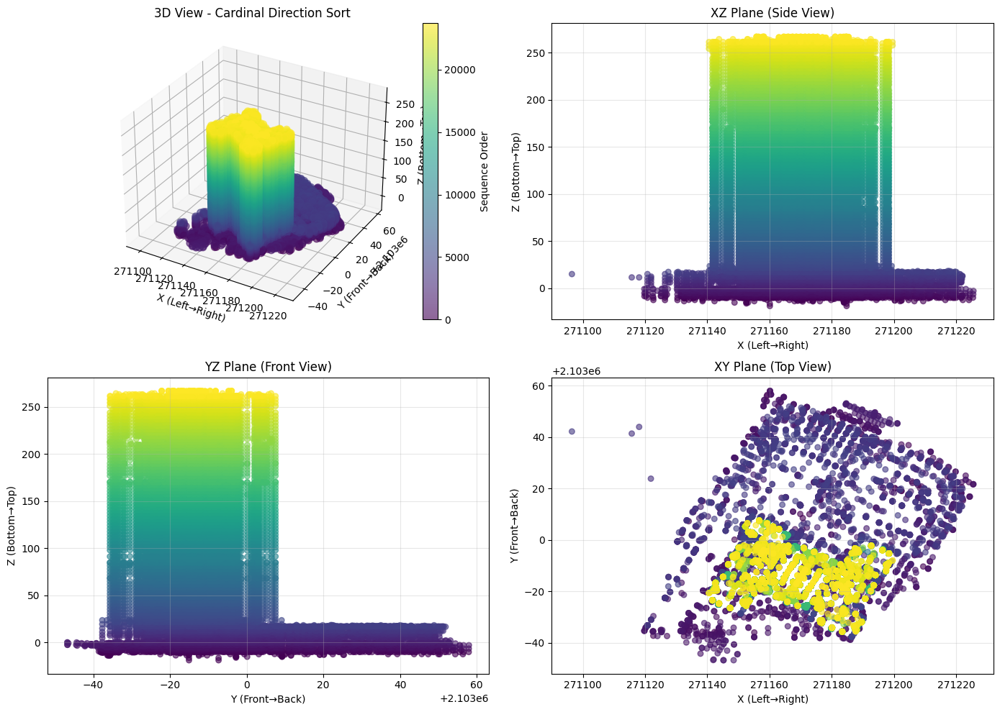


GENERATING ANIMATED VISUALIZATION
Creating animation with 3ms interval per point...

Generating animation with 200 frames at 3ms interval...
This may take a moment for large datasets...
Saving animation to: construction_animation.gif
Animation saved successfully!

ANALYSIS COMPLETE

Recommendation:
- Cardinal Direction Sort: Best for simple bottom-up, left-right ordering
- Plane Sweep: Best for floor-by-floor construction visualization
- Layer-by-Layer: Best for multi-story building sequencing
- Nearest Neighbor: Best for realistic construction path following


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D
import time

class TopologicalSweeper3D:
    """
    Implements multiple 3D topological sweeping algorithms for spatial ordering
    """

    def __init__(self, data_path):
        """Initialize with CSV data containing PositionX, PositionY, PositionZ columns"""
        self.df = pd.read_csv(data_path)
        self.points = None
        self.ordered_indices = None
        self.prepare_data()

    def prepare_data(self):
        """Extract and validate 3D coordinates"""
        required_cols = ['PositionX', 'PositionY', 'PositionZ']

        # Check if columns exist
        if not all(col in self.df.columns for col in required_cols):
            raise ValueError(f"CSV must contain columns: {required_cols}")

        # Extract coordinates
        self.points = self.df[required_cols].values
        print(f"Loaded {len(self.points)} points from dataset")
        print(f"X range: [{self.points[:, 0].min():.2f}, {self.points[:, 0].max():.2f}]")
        print(f"Y range: [{self.points[:, 1].min():.2f}, {self.points[:, 1].max():.2f}]")
        print(f"Z range: [{self.points[:, 2].min():.2f}, {self.points[:, 2].max():.2f}]")

    def cardinal_direction_sort(self):
        """
        Algorithm 1: Cardinal Direction Sorting
        Primary: Z (bottom to top)
        Secondary: X (left to right)
        Tertiary: Y (front to back)

        Time Complexity: O(n log n)
        Space Complexity: O(n)
        """
        print("\n=== Cardinal Direction Sort ===")
        print("Ordering: Z↑ (bottom→top), X→ (left→right), Y→ (front→back)")

        # Lexicographic sort: sort by (Z, X, Y)
        self.ordered_indices = np.lexsort((
            self.points[:, 1],  # Y (tertiary)
            self.points[:, 0],  # X (secondary)
            self.points[:, 2]   # Z (primary)
        ))

        return self.ordered_indices

    def plane_sweep_algorithm(self, num_planes=10):
        """
        Algorithm 2: Plane Sweep
        Sweeps horizontal planes from bottom to top
        Within each plane, orders left-to-right, front-to-back

        Time Complexity: O(n log n)
        Space Complexity: O(n)
        """
        print(f"\n=== Plane Sweep Algorithm (Z-axis, {num_planes} planes) ===")

        z_min, z_max = self.points[:, 2].min(), self.points[:, 2].max()
        plane_height = (z_max - z_min) / num_planes

        ordered_points = []

        for i in range(num_planes + 1):
            plane_z = z_min + i * plane_height

            # Find points near this plane (within tolerance)
            if i == 0:
                tolerance = plane_height / 2
                mask = self.points[:, 2] <= plane_z + tolerance
            elif i == num_planes:
                tolerance = plane_height / 2
                mask = self.points[:, 2] >= plane_z - tolerance
            else:
                tolerance = plane_height / 2
                mask = np.abs(self.points[:, 2] - plane_z) <= tolerance

            plane_points_idx = np.where(mask)[0]

            if len(plane_points_idx) > 0:
                # Sort points in this plane by X, then Y
                plane_points = self.points[plane_points_idx]
                local_order = np.lexsort((plane_points[:, 1], plane_points[:, 0]))
                ordered_points.extend(plane_points_idx[local_order])

        # Remove duplicates while preserving order
        seen = set()
        self.ordered_indices = []
        for idx in ordered_points:
            if idx not in seen:
                seen.add(idx)
                self.ordered_indices.append(idx)

        self.ordered_indices = np.array(self.ordered_indices)
        print(f"Processed {len(self.ordered_indices)} unique points across {num_planes} planes")

        return self.ordered_indices

    def layer_by_layer_sweep(self, layer_thickness=None):
        """
        Algorithm 3: Layer-by-Layer Sweep (Construction Sequencing)
        Groups points into horizontal layers (floors/stories)
        Orders within each layer: left→right, front→back

        Time Complexity: O(n log n)
        Space Complexity: O(n)
        """
        print("\n=== Layer-by-Layer Sweep (Construction Floors) ===")

        # Auto-detect layer thickness if not provided
        if layer_thickness is None:
            z_range = self.points[:, 2].max() - self.points[:, 2].min()
            # Estimate typical floor height (3-5 meters)
            layer_thickness = z_range / 10  # Divide into ~10 floors
            print(f"Auto-detected layer thickness: {layer_thickness:.2f} units")

        # Assign each point to a layer
        z_min = self.points[:, 2].min()
        layer_ids = np.floor((self.points[:, 2] - z_min) / layer_thickness).astype(int)

        # Sort within each layer
        ordered_points = []
        unique_layers = np.unique(layer_ids)

        print(f"Processing {len(unique_layers)} layers...")

        for layer in unique_layers:
            layer_mask = layer_ids == layer
            layer_indices = np.where(layer_mask)[0]
            layer_points = self.points[layer_indices]

            # Sort by X, then Y within this layer
            local_order = np.lexsort((layer_points[:, 1], layer_points[:, 0]))
            ordered_points.extend(layer_indices[local_order])

        self.ordered_indices = np.array(ordered_points)
        print(f"Ordered {len(self.ordered_indices)} points across {len(unique_layers)} layers")

        return self.ordered_indices

    def nearest_neighbor_sweep(self, start_direction='bottom-left'):
        """
        Algorithm 4: Modified Nearest Neighbor with Cardinal Bias
        Starts from bottom-left corner, prioritizes Z-up and X-right movement

        Time Complexity: O(n²) - not optimal but follows construction logic
        Space Complexity: O(n)
        """
        print("\n=== Nearest Neighbor Sweep with Cardinal Bias ===")
        print(f"Starting from: {start_direction}")

        n = len(self.points)
        visited = np.zeros(n, dtype=bool)
        ordered = []

        # Find starting point (bottom-left-front corner)
        if start_direction == 'bottom-left':
            start_idx = np.argmin(
                self.points[:, 2] * 1000 +  # Z (highest priority)
                self.points[:, 0] * 10 +     # X
                self.points[:, 1]            # Y
            )
        else:
            start_idx = 0

        current_idx = start_idx
        visited[current_idx] = True
        ordered.append(current_idx)

        # Weights for cardinal direction preference
        w_z = 10.0   # Strong upward preference
        w_x = 5.0    # Moderate rightward preference
        w_y = 1.0    # Weak forward preference

        for _ in range(n - 1):
            current_point = self.points[current_idx]

            # Calculate weighted distances to unvisited points
            unvisited_mask = ~visited
            if not np.any(unvisited_mask):
                break

            # Cardinal-biased distance
            delta = self.points[unvisited_mask] - current_point

            # Penalize backward/downward movement heavily
            penalties = np.zeros(len(delta))
            penalties[delta[:, 2] < 0] += 100  # Penalize going down
            penalties[delta[:, 0] < 0] += 50   # Penalize going left

            # Weighted distance with cardinal preference
            distances = (
                w_z * np.abs(delta[:, 2]) +
                w_x * np.abs(delta[:, 0]) +
                w_y * np.abs(delta[:, 1]) +
                penalties
            )

            # Select nearest unvisited point
            unvisited_indices = np.where(unvisited_mask)[0]
            nearest_local_idx = np.argmin(distances)
            nearest_idx = unvisited_indices[nearest_local_idx]

            visited[nearest_idx] = True
            ordered.append(nearest_idx)
            current_idx = nearest_idx

        self.ordered_indices = np.array(ordered)
        print(f"Ordered {len(self.ordered_indices)} points using nearest neighbor")

        return self.ordered_indices

    def get_ordered_points(self):
        """Return points in the computed order"""
        if self.ordered_indices is None:
            raise ValueError("Must run an ordering algorithm first")
        return self.points[self.ordered_indices]

    def plot_ordered_sequence(self, algorithm_name="", save_path=None):
        """
        Plot the ordered sequence with color gradient showing order
        """
        if self.ordered_indices is None:
            raise ValueError("Must run an ordering algorithm first")

        ordered_points = self.points[self.ordered_indices]

        fig = plt.figure(figsize=(14, 10))

        # 3D plot
        ax1 = fig.add_subplot(221, projection='3d')
        colors = np.arange(len(ordered_points))
        scatter = ax1.scatter(
            ordered_points[:, 0],
            ordered_points[:, 1],
            ordered_points[:, 2],
            c=colors,
            cmap='viridis',
            s=50,
            alpha=0.6
        )
        ax1.set_xlabel('X (Left→Right)')
        ax1.set_ylabel('Y (Front→Back)')
        ax1.set_zlabel('Z (Bottom→Top)')
        ax1.set_title(f'3D View - {algorithm_name}')
        plt.colorbar(scatter, ax=ax1, label='Sequence Order')

        # XZ projection (side view)
        ax2 = fig.add_subplot(222)
        ax2.scatter(
            ordered_points[:, 0],
            ordered_points[:, 2],
            c=colors,
            cmap='viridis',
            s=30,
            alpha=0.6
        )
        ax2.set_xlabel('X (Left→Right)')
        ax2.set_ylabel('Z (Bottom→Top)')
        ax2.set_title('XZ Plane (Side View)')
        ax2.grid(True, alpha=0.3)

        # YZ projection (front view)
        ax3 = fig.add_subplot(223)
        ax3.scatter(
            ordered_points[:, 1],
            ordered_points[:, 2],
            c=colors,
            cmap='viridis',
            s=30,
            alpha=0.6
        )
        ax3.set_xlabel('Y (Front→Back)')
        ax3.set_ylabel('Z (Bottom→Top)')
        ax3.set_title('YZ Plane (Front View)')
        ax3.grid(True, alpha=0.3)

        # XY projection (top view)
        ax4 = fig.add_subplot(224)
        ax4.scatter(
            ordered_points[:, 0],
            ordered_points[:, 1],
            c=colors,
            cmap='viridis',
            s=30,
            alpha=0.6
        )
        ax4.set_xlabel('X (Left→Right)')
        ax4.set_ylabel('Y (Front→Back)')
        ax4.set_title('XY Plane (Top View)')
        ax4.grid(True, alpha=0.3)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"Plot saved to: {save_path}")

        plt.show()

    def create_animation(self, interval_ms=3, algorithm_name="", save_path=None, num_frames_to_animate=None):
        """
        Create animated visualization showing points appearing incrementally

        Parameters:
        -----------
        interval_ms : int
            Milliseconds between frames (default: 3ms as requested)
        algorithm_name : str
            Name of the algorithm used
        save_path : str
            Path to save animation (optional)
        num_frames_to_animate : int
            Maximum number of points to animate. If None, all points are animated.
        """
        if self.ordered_indices is None:
            raise ValueError("Must run an ordering algorithm first")

        ordered_points_full = self.points[self.ordered_indices]

        if num_frames_to_animate is not None:
            ordered_points = ordered_points_full[:num_frames_to_animate]
        else:
            ordered_points = ordered_points_full

        n_points = len(ordered_points)

        # Setup figure
        fig = plt.figure(figsize=(15, 5))

        # 3D view
        ax1 = fig.add_subplot(131, projection='3d')
        ax1.set_xlabel('X (Left→Right)')
        ax1.set_ylabel('Y (Front→Back)')
        ax1.set_zlabel('Z (Bottom→Top)')
        ax1.set_title(f'3D Incremental Display - {algorithm_name}')

        # XZ view (side)
        ax2 = fig.add_subplot(132)
        ax2.set_xlabel('X (Left→Right)')
        ax2.set_ylabel('Z (Bottom→Top)')
        ax2.set_title('XZ Side View')
        ax2.grid(True, alpha=0.3)

        # YZ view (front)
        ax3 = fig.add_subplot(133)
        ax3.set_xlabel('Y (Front→Back)')
        ax3.set_ylabel('Z (Bottom→Top)')
        ax3.set_title('YZ Front View')
        ax3.grid(True, alpha=0.3)

        # Set consistent axis limits using the full dataset to avoid axis changes during animation
        for ax in [ax1, ax2, ax3]:
            if hasattr(ax, 'set_xlim3d'):  # 3D axis
                ax.set_xlim3d([ordered_points_full[:, 0].min(), ordered_points_full[:, 0].max()])
                ax.set_ylim3d([ordered_points_full[:, 1].min(), ordered_points_full[:, 1].max()])
                ax.set_zlim3d([ordered_points_full[:, 2].min(), ordered_points_full[:, 2].max()])
            else:  # 2D axes
                if ax == ax2:
                    ax.set_xlim([ordered_points_full[:, 0].min(), ordered_points_full[:, 0].max()])
                    ax.set_ylim([ordered_points_full[:, 2].min(), ordered_points_full[:, 2].max()])
                else:  # ax3
                    ax.set_xlim([ordered_points_full[:, 1].min(), ordered_points_full[:, 1].max()])
                    ax.set_ylim([ordered_points_full[:, 2].min(), ordered_points_full[:, 2].max()])

        # Initialize scatter plots
        scatter1 = ax1.scatter([], [], [], c=[], cmap='viridis', s=50, alpha=0.7)
        scatter2 = ax2.scatter([], [], c=[], cmap='viridis', s=30, alpha=0.7)
        scatter3 = ax3.scatter([], [], c=[], cmap='viridis', s=30, alpha=0.7)

        # Progress text
        progress_text = fig.text(0.5, 0.95, '', ha='center', fontsize=12, weight='bold')

        def init():
            """Initialize animation"""
            # Clear current plots (only for initial setup)
            ax1.clear()
            ax2.clear()
            ax3.clear()

            # Re-set labels and titles after clearing
            ax1.set_xlabel('X (Left→Right)')
            ax1.set_ylabel('Y (Front→Back)')
            ax1.set_zlabel('Z (Bottom→Top)')
            ax1.set_title(f'3D Incremental Display - {algorithm_name}')
            ax2.set_xlabel('X (Left→Right)')
            ax2.set_ylabel('Z (Bottom→Top)')
            ax2.set_title('XZ Side View')
            ax2.grid(True, alpha=0.3)
            ax3.set_xlabel('Y (Front→Back)')
            ax3.set_ylabel('Z (Bottom→Top)')
            ax3.set_title('YZ Front View')
            ax3.grid(True, alpha=0.3)

            # Re-set axis limits (as clearing might reset them)
            ax1.set_xlim3d([ordered_points_full[:, 0].min(), ordered_points_full[:, 0].max()])
            ax1.set_ylim3d([ordered_points_full[:, 1].min(), ordered_points_full[:, 1].max()])
            ax1.set_zlim3d([ordered_points_full[:, 2].min(), ordered_points_full[:, 2].max()])
            ax2.set_xlim([ordered_points_full[:, 0].min(), ordered_points_full[:, 0].max()])
            ax2.set_ylim([ordered_points_full[:, 2].min(), ordered_points_full[:, 2].max()])
            ax3.set_xlim([ordered_points_full[:, 1].min(), ordered_points_full[:, 1].max()])
            ax3.set_ylim([ordered_points_full[:, 2].min(), ordered_points_full[:, 2].max()])

            # Initialize empty scatter plots for blitting
            scatter1_init = ax1.scatter([], [], [], c=[], cmap='viridis', s=50, alpha=0.7)
            scatter2_init = ax2.scatter([], [], c=[], cmap='viridis', s=30, alpha=0.7)
            scatter3_init = ax3.scatter([], [], c=[], cmap='viridis', s=30, alpha=0.7)

            return scatter1_init, scatter2_init, scatter3_init, progress_text

        def update(frame):
            """Update function for animation"""
            current_points = ordered_points[:frame+1]
            colors = np.arange(frame+1)

            # Clear current scatter points on all axes
            for ax in fig.axes:
                if hasattr(ax, 'collections'): # Check if it's a scatter plot
                    for col in ax.collections:
                        col.remove()

            # Update 3D plot
            scatter1_updated = ax1.scatter(
                current_points[:, 0],
                current_points[:, 1],
                current_points[:, 2],
                c=colors,
                cmap='viridis',
                s=50,
                alpha=0.7
            )

            # Update XZ plot
            scatter2_updated = ax2.scatter(
                current_points[:, 0],
                current_points[:, 2],
                c=colors,
                cmap='viridis',
                s=30,
                alpha=0.7
            )

            # Update YZ plot
            scatter3_updated = ax3.scatter(
                current_points[:, 1],
                current_points[:, 2],
                c=colors,
                cmap='viridis',
                s=30,
                alpha=0.7
            )

            # Update progress
            progress_text.set_text(f'Point {frame+1}/{n_points} | Progress: {100*(frame+1)/n_points:.1f}%')

            return scatter1_updated, scatter2_updated, scatter3_updated, progress_text

        # Define a progress callback for saving
        def saving_progress_callback(current_frame, total_frames):
            progress_percent = (current_frame / total_frames) * 100
            print(f"Saving animation: Frame {current_frame}/{total_frames} ({progress_percent:.1f}%)   ", end='\r')
            if current_frame == total_frames:
                print("\nAnimation saving complete!")

        # Create animation
        print(f"\nGenerating animation with {n_points} frames at {interval_ms}ms interval...")
        print("This may take a moment for large datasets...")

        anim = FuncAnimation(
            fig,
            update,
            init_func=init,
            frames=n_points,
            interval=interval_ms,
            blit=False,
            repeat=False # Set repeat to False so it stops after one cycle
        )

        plt.tight_layout()

        if save_path:
            print(f"Saving animation to: {save_path}")
            # Use 'pillow' writer for gif
            anim.save(save_path, writer='pillow', fps=1000//interval_ms, progress_callback=saving_progress_callback)
            print("Animation saved successfully!")

        plt.close(fig) # Close the figure to free up memory after saving
        # Important: Return the animation object to prevent it from being garbage-collected
        return anim

def main():
    """
    Main function demonstrating all algorithms
    """
    print("="*60)
    print("3D TOPOLOGICAL SWEEPING FOR CONSTRUCTION VISUALIZATION")
    print("="*60)

    # Initialize sweeper
    data_path = '/content/multistorey_building.csv'
    sweeper = TopologicalSweeper3D(data_path)

    # Dictionary to store results
    algorithms = {
        'Cardinal Direction Sort': sweeper.cardinal_direction_sort,
        'Plane Sweep': lambda: sweeper.plane_sweep_algorithm(num_planes=10),
        'Layer-by-Layer': sweeper.layer_by_layer_sweep,
        'Nearest Neighbor': lambda: sweeper.nearest_neighbor_sweep(start_direction='bottom-left')
    }

    # Run and visualize each algorithm
    global animation_obj # Declare global to keep it alive in Colab
    animation_obj = None

    for name, algorithm in algorithms.items():
        print(f"\n{'='*60}")
        print(f"Running: {name}")
        print('='*60)

        # Run algorithm
        start_time = time.time()
        algorithm()
        elapsed = time.time() - start_time
        print(f"Execution time: {elapsed:.4f} seconds")

        # Plot static visualization
        sweeper.plot_ordered_sequence(algorithm_name=name)

        # Ask user if they want animation (for first algorithm only to save time)
        if name == 'Cardinal Direction Sort':
            print("\n" + "="*60)
            print("GENERATING ANIMATED VISUALIZATION")
            print("="*60)
            print("Creating animation with 3ms interval per point...")
            # Assign the animation object to the global variable
            animation_obj = sweeper.create_animation(
                interval_ms=3,
                algorithm_name=name,
                save_path='construction_animation.gif', # Save to GIF
                num_frames_to_animate=200 # Animate only the first 200 points
            )
            # We break here to only display one animation as requested, otherwise all animations would run
            break

    print("\n" + "="*60)
    print("ANALYSIS COMPLETE")
    print("="*60)
    print("\nRecommendation:")
    print("- Cardinal Direction Sort: Best for simple bottom-up, left-right ordering")
    print("- Plane Sweep: Best for floor-by-floor construction visualization")
    print("- Layer-by-Layer: Best for multi-story building sequencing")
    print("- Nearest Neighbor: Best for realistic construction path following")


if __name__ == "__main__":
    main()


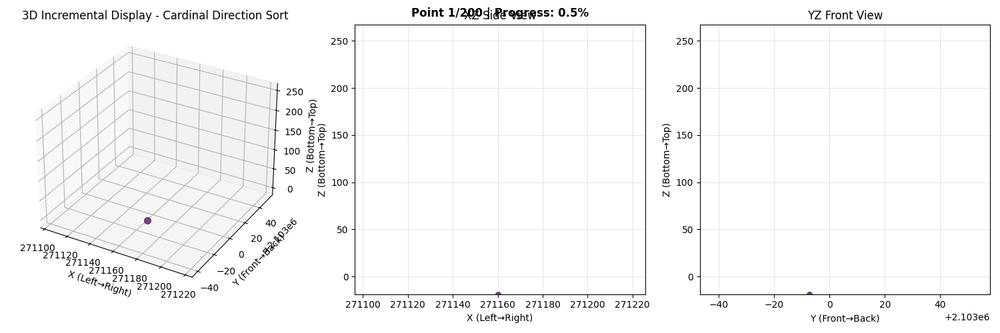

In [3]:
from IPython.display import Image
Image(filename='construction_animation.gif')